In [ ]:
import detectron2
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

register_coco_instances("<insert dataset name>", {}, "<insert path to .json>", "<insert path to images>")



Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



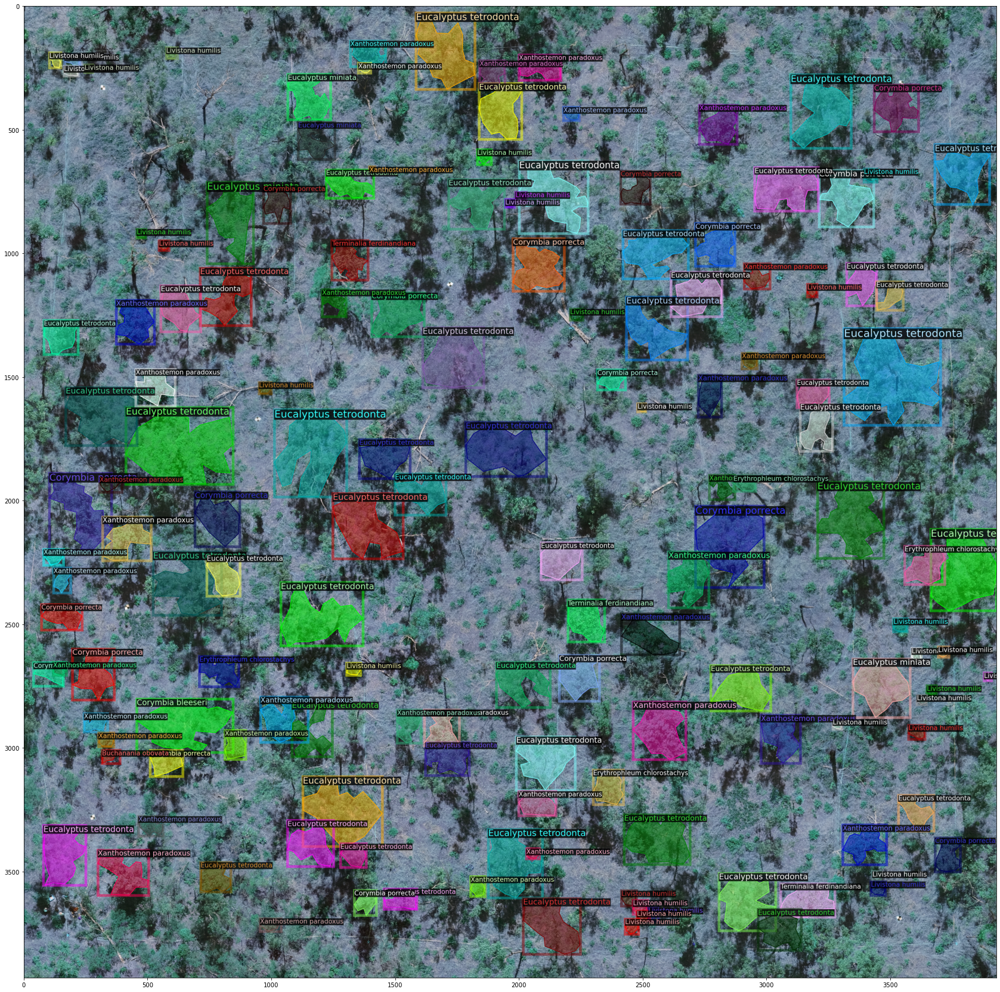

In [3]:
trees_metadata = MetadataCatalog.get("<insert dataset name>")
tree_dicts = DatasetCatalog.get("<insert dataset name>")

for d in random.sample(tree_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=trees_metadata,scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (30,30))
    plt.imshow(vis.get_image()[:,:, ::-1])
    plt.show()

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("<insert dataset name>",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9 # dynamically work out number of classes
# uncomment for semantic segmentation
#cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = len(class_labels) # dynamically work out number of classes

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("tree_dataset_test5", )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("tree_dataset_test5", cfg, False, output_dir="./output/COCO_evaluator")
val_loader = build_detection_test_loader(cfg, "tree_dataset_test5")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test